# <center>Machine Learning Project</center>

Description of the project

** **
## <center>*01 - Exploratory Data Analysis Notebook*</center>

** **

**Description of the notebook**


Overview of the dataset: summary statistics, data types and missing values

EDA: univariate analysis, multivariate analysis, class distributions

Visualizations: heatmaps, histograms, box plots

Incoherencies

Insides and potential issues

In this notebook, no data should be changed only explored


The members of the `team` are:
- Ana Farinha - 20211514
- Francisco Capontes - 20211692
- Maria Cruz - 20230760
- Sofia Gomes - 20240848
- Tahiya Laboni - 20240943

# Table of Contents

<a class="anchor" id="top"></a>


1. [Importing Libraries & Data](#1.-Importing-Libraries-&-Data)<br><br>
    
2. [Exploratory Data Analysis](#2.-Exploratory-Data-Analysis)

    2.1 [Missing Values](#2.1-Missing-Values)
    
    2.2 [Duplicates](#2.2-Duplicates)
    
    2.3 [Incoherencies](#2.3-Incoherencies)
    
    2.4 [Outliers](#2.4-Outliers)
    
    2.5 [Visualisations](#2.5-Visualisations) <br><br>


# 1. Importing Libraries & Data

In [29]:
# Import libraries
import pandas as pd
from scipy import stats

# Visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd

In [30]:
# Import dataset
df = pd.read_csv('./project_data/train_data.csv')
df

C:\Users\Utilizador\AppData\Local\Temp\ipykernel_9772\1134853745.py:2: DtypeWarning:

Columns (29) have mixed types. Specify dtype option on import or set low_memory=False.



,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,...,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Agreement Reached,WCB Decision,Number of Dependents
0,2019-12-30,31.0,N,2020-01-01,N,0.00,1988.0,2019-12-31,NaN,NEW HAMPSHIRE INSURANCE CO,...,27.0,FROM LIQUID OR GREASE SPILLS,10.0,CONTUSION,62.0,BUTTOCKS,13662,0.0,Not Work Related,1.0
1,2019-08-30,46.0,N,2020-01-01,Y,1745.93,1973.0,2020-01-01,2020-01-14,ZURICH AMERICAN INSURANCE CO,...,97.0,REPETITIVE MOTION,49.0,SPRAIN OR TEAR,38.0,SHOULDER(S),14569,1.0,Not Work Related,4.0
2,2019-12-06,40.0,N,2020-01-01,N,1434.80,1979.0,2020-01-01,NaN,INDEMNITY INSURANCE CO OF,...,79.0,OBJECT BEING LIFTED OR HANDLED,7.0,CONCUSSION,10.0,MULTIPLE HEAD INJURY,12589,0.0,Not Work Related,6.0
3,NaN,NaN,NaN,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-12-30,61.0,N,2020-01-01,N,NaN,1958.0,2019-12-31,NaN,STATE INSURANCE FUND,...,16.0,"HAND TOOL, UTENSIL; NOT POWERED",43.0,PUNCTURE,36.0,FINGER(S),12603,0.0,Not Work Related,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
593466,NaN,NaN,NaN,2022-12-31,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
593467,2022-12-13,72.0,N,2022-12-31,N,0.00,1950.0,2022-12-31,NaN,TECHNOLOGY INSURANCE CO. INC.,...,25.0,FROM DIFFERENT LEVEL (ELEVATION),90.0,MULTIPLE PHYSICAL INJURIES ONLY,-9.0,MULTIPLE,12779,0.0,Not Work Related,3.0
593468,NaN,NaN,NaN,2022-12-31,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
593469,NaN,NaN,NaN,2022-12-31,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# 2. Exploratory Data Analysis

<a href="#top">Top &#129033;</a>


In [31]:
# Show the fisrt 5 lines of the dataset
df.head()

,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,...,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Agreement Reached,WCB Decision,Number of Dependents
0,2019-12-30,31.0,N,2020-01-01,N,0.00,1988.0,2019-12-31,NaN,NEW HAMPSHIRE INSURANCE CO,...,27.0,FROM LIQUID OR GREASE SPILLS,10.0,CONTUSION,62.0,BUTTOCKS,13662,0.0,Not Work Related,1.0
1,2019-08-30,46.0,N,2020-01-01,Y,1745.93,1973.0,2020-01-01,2020-01-14,ZURICH AMERICAN INSURANCE CO,...,97.0,REPETITIVE MOTION,49.0,SPRAIN OR TEAR,38.0,SHOULDER(S),14569,1.0,Not Work Related,4.0
2,2019-12-06,40.0,N,2020-01-01,N,1434.80,1979.0,2020-01-01,NaN,INDEMNITY INSURANCE CO OF,...,79.0,OBJECT BEING LIFTED OR HANDLED,7.0,CONCUSSION,10.0,MULTIPLE HEAD INJURY,12589,0.0,Not Work Related,6.0
3,NaN,NaN,NaN,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-12-30,61.0,N,2020-01-01,N,NaN,1958.0,2019-12-31,NaN,STATE INSURANCE FUND,...,16.0,"HAND TOOL, UTENSIL; NOT POWERED",43.0,PUNCTURE,36.0,FINGER(S),12603,0.0,Not Work Related,1.0


In [32]:
# Show the total numbers of lines and columns
df.shape

(593471, 33)

In [33]:
# Show the general summary of the dataset
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 593471 entries, 0 to 593470
Data columns (total 33 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   Accident Date                       570337 non-null  object 
 1   Age at Injury                       574026 non-null  float64
 2   Alternative Dispute Resolution      574026 non-null  object 
 3   Assembly Date                       593471 non-null  object 
 4   Attorney/Representative             574026 non-null  object 
 5   Average Weekly Wage                 545375 non-null  float64
 6   Birth Year                          544948 non-null  float64
 7   C-2 Date                            559466 non-null  object 
 8   C-3 Date                            187245 non-null  object 
 9   Carrier Name                        574026 non-null  object 
 10  Carrier Type                        574026 non-null  object 
 11  Claim Identifier          

### Descriptive Variables

In [34]:
# Show some statistics about the dataset
df.describe()

,Age at Injury,Average Weekly Wage,Birth Year,Claim Identifier,IME-4 Count,Industry Code,OIICS Nature of Injury Description,WCIO Cause of Injury Code,WCIO Nature of Injury Code,WCIO Part Of Body Code,Agreement Reached,Number of Dependents
count,574026.000000,5.453750e+05,544948.000000,5.934710e+05,132803.000000,564068.000000,0.0,558386.000000,558369.000000,556944.000000,574026.000000,574026.000000
mean,42.114270,4.910883e+02,1886.767604,2.366760e+07,3.207337,58.645305,NaN,54.381143,41.013839,39.738146,0.046665,3.006559
std,14.256432,6.092918e+03,414.644423,1.079271e+08,2.832303,19.644175,NaN,25.874281,22.207521,22.365940,0.210921,2.000801
min,0.000000,0.000000e+00,0.000000,5.393066e+06,1.000000,11.000000,NaN,1.000000,1.000000,-9.000000,0.000000,0.000000
25%,31.000000,0.000000e+00,1965.000000,5.593414e+06,1.000000,45.000000,NaN,31.000000,16.000000,33.000000,0.000000,1.000000
50%,42.000000,0.000000e+00,1977.000000,5.791212e+06,2.000000,61.000000,NaN,56.000000,49.000000,38.000000,0.000000,3.000000
75%,54.000000,8.410000e+02,1989.000000,5.991000e+06,4.000000,71.000000,NaN,75.000000,52.000000,53.000000,0.000000,5.000000
max,117.000000,2.828079e+06,2018.000000,9.998917e+08,73.000000,92.000000,NaN,99.000000,91.000000,99.000000,1.000000,6.000000


In [35]:
# Create a dataframe with only numeric values
df_descriptive_vars = pd.DataFrame(df[['Age at Injury', 'Average Weekly Wage', 'Birth Year', 'Claim Identifier', 'IME-4 Count', 'Industry Code', 'WCIO Cause of Injury Code', 'WCIO Nature of Injury Code','WCIO Part Of Body Code', 'Agreement Reached', 'Number of Dependents']])
df_descriptive_vars

,Age at Injury,Average Weekly Wage,Birth Year,Claim Identifier,IME-4 Count,Industry Code,WCIO Cause of Injury Code,WCIO Nature of Injury Code,WCIO Part Of Body Code,Agreement Reached,Number of Dependents
0,31.0,0.00,1988.0,5393875,NaN,44.0,27.0,10.0,62.0,0.0,1.0
1,46.0,1745.93,1973.0,5393091,4.0,23.0,97.0,49.0,38.0,1.0,4.0
2,40.0,1434.80,1979.0,5393889,NaN,56.0,79.0,7.0,10.0,0.0,6.0
3,NaN,NaN,NaN,957648180,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,61.0,NaN,1958.0,5393887,NaN,62.0,16.0,43.0,36.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
593466,NaN,NaN,NaN,327160035,NaN,NaN,NaN,NaN,NaN,NaN,NaN
593467,72.0,0.00,1950.0,6165075,NaN,48.0,25.0,90.0,-9.0,0.0,3.0
593468,NaN,NaN,NaN,249875936,NaN,NaN,NaN,NaN,NaN,NaN,NaN
593469,NaN,NaN,NaN,120584215,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 2.1 Missing Values

<a href="#top">Top &#129033;</a>

## 2.2 Duplicates

<a href="#top">Top &#129033;</a>


## 2.3 Incoherencies

<a href="#top">Top &#129033;</a>


* Birth year está em float -> colocar como int

* Average Weekly Wage esta com valores a 0

* Age at Injury e Birth Year devem ser verificados (por exemplo, garantindo que a Age at Injury corresponda razoavelmente ao Birth Year).

* Garanta que as datas sejam consistentes em termos de sequências de eventos (por exemplo, a Accident Date deve logicamente preceder a Assembly Date).

## 2.4 Outliers

<a href="#top">Top &#129033;</a>


## 2.5 Visualisations

<a href="#top">Top &#129033;</a>

### Numerical Variables

In [36]:
# Create a dataframe with only numeric values
df_descriptive_vars = pd.DataFrame(df[['Age at Injury', 'Average Weekly Wage', 'Birth Year', 'Claim Identifier', 'IME-4 Count', 'Industry Code', 'WCIO Cause of Injury Code', 'WCIO Nature of Injury Code','WCIO Part Of Body Code', 'Agreement Reached', 'Number of Dependents']])
df_descriptive_vars

,Age at Injury,Average Weekly Wage,Birth Year,Claim Identifier,IME-4 Count,Industry Code,WCIO Cause of Injury Code,WCIO Nature of Injury Code,WCIO Part Of Body Code,Agreement Reached,Number of Dependents
0,31.0,0.00,1988.0,5393875,NaN,44.0,27.0,10.0,62.0,0.0,1.0
1,46.0,1745.93,1973.0,5393091,4.0,23.0,97.0,49.0,38.0,1.0,4.0
2,40.0,1434.80,1979.0,5393889,NaN,56.0,79.0,7.0,10.0,0.0,6.0
3,NaN,NaN,NaN,957648180,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,61.0,NaN,1958.0,5393887,NaN,62.0,16.0,43.0,36.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
593466,NaN,NaN,NaN,327160035,NaN,NaN,NaN,NaN,NaN,NaN,NaN
593467,72.0,0.00,1950.0,6165075,NaN,48.0,25.0,90.0,-9.0,0.0,3.0
593468,NaN,NaN,NaN,249875936,NaN,NaN,NaN,NaN,NaN,NaN,NaN
593469,NaN,NaN,NaN,120584215,NaN,NaN,NaN,NaN,NaN,NaN,NaN


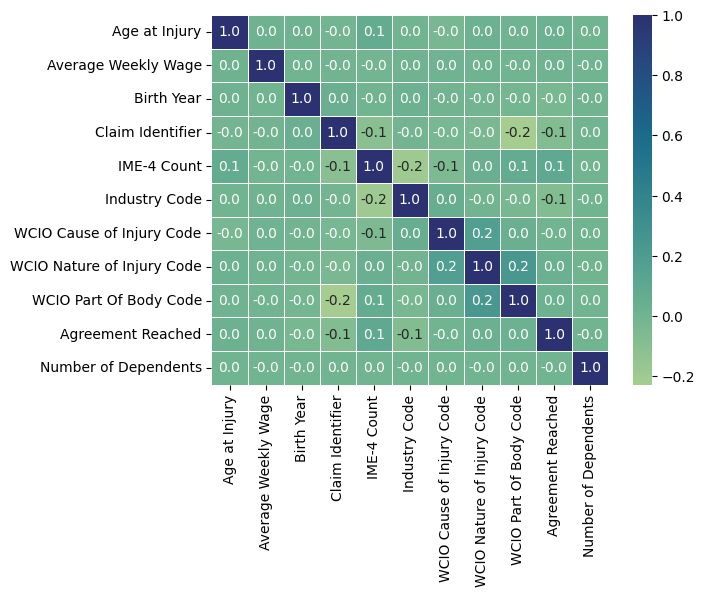

In [37]:
# Look for relationships between descriptive variables
correlation_matrix = df_descriptive_vars.corr()
sns.heatmap(correlation_matrix, annot=True, fmt=".1f", linewidth=.5, cmap="crest")
plt.show()

### Categorical Variables

In [38]:
# Select dates
cols_to_drop = df.columns[df.columns.str.contains('Date')]

In [39]:
# Create dataframe with categorical features only
categorical_df = df.loc[:,(df.dtypes == 'object') == True].drop(cols_to_drop, axis = 1)

In [40]:
# Check unique values of the categorical variables
for column in categorical_df.columns:
    print('=========================')
    print(categorical_df[column].value_counts())
    print(f'Missing values: {categorical_df[column].isna().sum()}')
    print('=========================')
    print()

Alternative Dispute Resolution
N    571412
Y      2609
U         5
Name: count, dtype: int64
Missing values: 19445

Attorney/Representative
N    392291
Y    181735
Name: count, dtype: int64
Missing values: 19445

Carrier Name
STATE INSURANCE FUND            111144
POLICE, FIRE, SANITATION         21602
AMERICAN ZURICH INSURANCE CO     17540
CHARTER OAK FIRE INS CO          17176
INDEMNITY INS. OF N AMERICA      14366
                                 ...  
LOWES HOME CENTERS INC               1
WEST BEND MUTUAL INSURANCE           1
LIVINGSTON-STEUBEN-                  1
NEW YORK MUTUAL CASUALTY             1
HERMON-DEKALB CENTRAL                1
Name: count, Length: 2046, dtype: int64
Missing values: 19445

Carrier Type
1A. PRIVATE                                    285368
3A. SELF PUBLIC                                121920
2A. SIF                                        111144
4A. SELF PRIVATE                                52788
UNKNOWN                                          1774

In the output above, the unique values of the categorical features can be seen. Here are some conclusions about the categorical varaibles:
- *Alternative Dispute Resolution* has 5 rows with the value *U*.
- *Carrier Name* has several values with *STATE INSURANCE FUND* being the biggest group.
- *Claim Injury Type* is the target with 8 possible values, excluding the missing values which will be removed.
- * County of Injury

In [41]:
df[df['Alternative Dispute Resolution'] == 'U'].T

,145799,493388,494317,551004,551394
Accident Date,2018-03-12,2021-11-05,2022-07-06,2022-09-01,2022-08-29
Age at Injury,57.0,56.0,52.0,57.0,55.0
Alternative Dispute Resolution,U,U,U,U,U
Assembly Date,2020-10-21,2022-07-11,2022-07-13,2022-10-17,2022-10-17
Attorney/Representative,N,N,Y,N,N
Average Weekly Wage,0.0,0.0,0.0,NaN,0.0
Birth Year,1961.0,1965.0,1969.0,1965.0,1967.0
C-2 Date,NaN,NaN,NaN,NaN,NaN
C-3 Date,NaN,NaN,2023-03-09,NaN,NaN
Carrier Name,ELECTRICAL EMPLOYERS,ELECTRICAL EMPLOYERS,ELECTRICAL EMPLOYERS,ELECTRICAL EMPLOYERS,ELECTRICAL EMPLOYERS


In [42]:
# Compare Carrier Name and Carrier Type
# Whats the difference between Gender = X or Gender = U

In [43]:
'''
Multiclass variable: Decision of the WCB relative to the claim:
“Accident” means that claim refers to workplace accident,
“Occupational Disease” means illness from the workplace. ->
requires WCB deliberation so it is unknown at start of claim.
'''
df['WCB Decision'].unique()

array(['Not Work Related', nan], dtype=object)

### Chi-Squared Test

In [44]:
def TestIndependence(X,y,var,alpha=0.05):        
    dfObserved = pd.crosstab(y,X) 
    chi2, p, dof, expected = stats.chi2_contingency(dfObserved.values)
    dfExpected = pd.DataFrame(expected, columns=dfObserved.columns, index = dfObserved.index)
    if p<alpha:
        result="{0} is IMPORTANT for Prediction".format(var)
    else:
        result="{0} is NOT an important predictor. (Discard {0} from model)".format(var)
    print(result)

# Do it only on training data

In [45]:
for var in categorical_df.columns:
    TestIndependence(df[var],df['Claim Injury Type'], var)

Alternative Dispute Resolution is IMPORTANT for Prediction
Attorney/Representative is IMPORTANT for Prediction
Carrier Name is IMPORTANT for Prediction
Carrier Type is IMPORTANT for Prediction
Claim Injury Type is IMPORTANT for Prediction
County of Injury is IMPORTANT for Prediction
COVID-19 Indicator is IMPORTANT for Prediction
District Name is IMPORTANT for Prediction
Gender is IMPORTANT for Prediction
Industry Code Description is IMPORTANT for Prediction
Medical Fee Region is IMPORTANT for Prediction
WCIO Cause of Injury Description is IMPORTANT for Prediction
WCIO Nature of Injury Description is IMPORTANT for Prediction
WCIO Part Of Body Description is IMPORTANT for Prediction
Zip Code is IMPORTANT for Prediction
WCB Decision is NOT an important predictor. (Discard WCB Decision from model)


In [46]:
df['Claim Injury Type'] # Label ENcoding is possible because numbering indicates severity

0          2. NON-COMP
1         4. TEMPORARY
2         4. TEMPORARY
3                  NaN
4          2. NON-COMP
              ...     
593466             NaN
593467     2. NON-COMP
593468             NaN
593469             NaN
593470             NaN
Name: Claim Injury Type, Length: 593471, dtype: object

In [47]:
df[df['Claim Injury Type'].isna()].isna().sum()

Accident Date                         19445
Age at Injury                         19445
Alternative Dispute Resolution        19445
Assembly Date                             0
Attorney/Representative               19445
Average Weekly Wage                   19445
Birth Year                            19445
C-2 Date                              19445
C-3 Date                              19445
Carrier Name                          19445
Carrier Type                          19445
Claim Identifier                          0
Claim Injury Type                     19445
County of Injury                      19445
COVID-19 Indicator                    19445
District Name                         19445
First Hearing Date                    19445
Gender                                19445
IME-4 Count                           19445
Industry Code                         19445
Industry Code Description             19445
Medical Fee Region                    19445
OIICS Nature of Injury Descripti

In [48]:
19445/593471

0.03276486972404717

To use the categorical variables, it is necessary to encode them as most models do not accept non-numerical values. With that in mind, several options were explored:
- One-hot encoding:
- Label encoding:
- Target encoding:


#### Number of injuries per county

In [49]:
# Load New York counties shapefile from: https://gis.ny.gov/civil-boundaries
ny_counties = gpd.read_file('NY_counties/Counties.shp')

In [50]:
# Remove the na to make the visualization possible
df_cleaned = df.dropna(subset=['Claim Injury Type'])

In [51]:
# Create Dataframe with the number of injuries per County
inj_by_county_df = df_cleaned['County of Injury'].value_counts().reset_index()
# Rename columns
inj_by_county_df.columns = ['NAME', 'Count']
# Capitalize the first letter of each entry in the 'County' column
inj_by_county_df['NAME'] = inj_by_county_df['NAME'].str.capitalize()

In [52]:
# Merge the client counts with the counties GeoDataFrame
ny_counties = ny_counties.merge(inj_by_county_df, on='NAME', how = 'right')

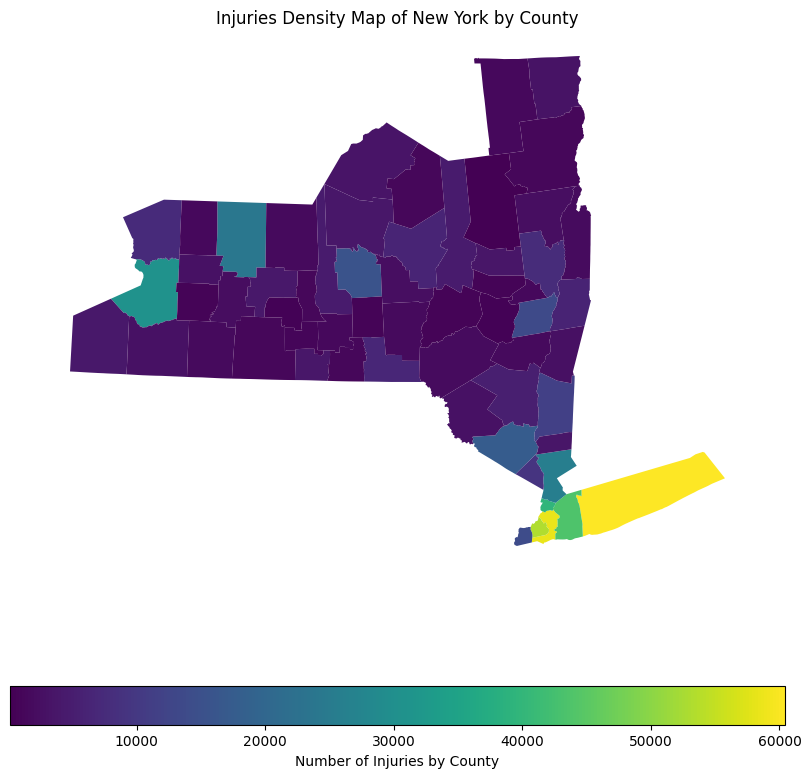

In [68]:
# Plot
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ny_counties.plot(column='Count', ax=ax, legend=True,
                 legend_kwds={'label': "Number of Injuries by County",
                              'orientation': "horizontal"})

# Remove x and y axis
ax.set_axis_off()

plt.title('Injuries Density Map of New York by County')
plt.show()

In [74]:
import plotly.express as px
import geopandas as gpd

# Assuming ny_counties is a GeoDataFrame with 'Count' and 'CountyName' columns
fig = px.choropleth(ny_counties,
                    geojson=ny_counties.geometry,
                    locations=ny_counties.index,
                    color='Count',
                    hover_name='NAME',
                    labels={'Count': 'Number of Injuries'},
                    title='Number of Injuries by County in NY')

fig.update_geos(fitbounds="locations")
fig.show()


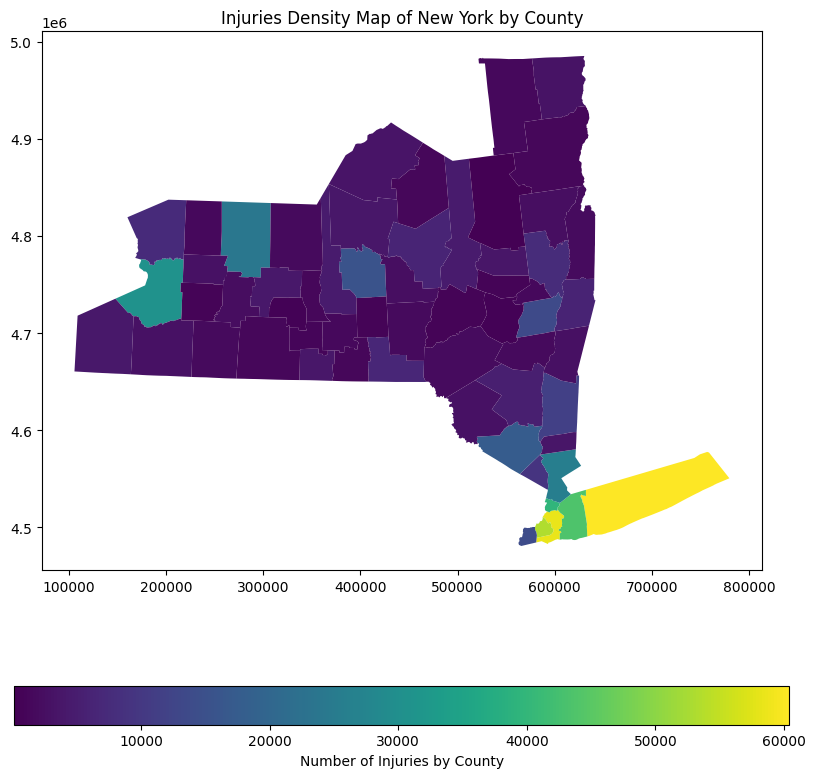

In [67]:
import matplotlib.pyplot as plt
import geopandas as gpd
import mplcursors

# Plot
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
# Create the plot and store the returned artist objects
county_plot = ny_counties.plot(column='Count', ax=ax, legend=True,
                               legend_kwds={'label': "Number of Injuries by County",
                                            'orientation': "horizontal"})
plt.title('Injuries Density Map of New York by County')

# Add hover functionality
cursor = mplcursors.cursor()

@cursor.connect("add")
def on_add(sel):
    # Find the index of the hovered patch
    index = sel.index
    print(f'Hovered index: {index}')  # Debugging line
    # Access the attributes directly from the GeoDataFrame
    county_name = ny_counties.at[index, 'NAME']  # Adjust to your actual column name for county
    injury_count = ny_counties.at[index, 'Count']  # Ensure this matches your DataFrame
    # Set a simple annotation for testing
    sel.annotation.set(text=f'County: {county_name}\nInjuries: {injury_count}')

# Show the plot
plt.show()
